In [2]:
import os
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt
import matplotlib
import contextily as cx
import math
os.getcwd()


/Users/johanlen/opt/anaconda3/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


'/Users/johanlen/Desktop/Kings/Induvidual Project/data'

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth', None)
crs={'init':'EPSG:4326'}

In [3]:
df_5 = pd.read_csv('../data/2021-12/2021-12/2021-12-metropolitan-street.csv')
# df_5

In [4]:
df_3 = pd.read_csv('../data/2021-12/2021-12/2021-12-metropolitan-outcomes.csv')
# df.info()
# # df.loc[1000:1000]
# df.groupby('Reported by').count()
# df_3

In [5]:
df_4 = gpd.read_file('../data/2021-12/2021-12/2021-12-metropolitan-stop-and-search.csv')
# df.head(1)
print(df_4.shape[0])


# df_4 = df_4.to_crs('EPSG:4326')

df_4['Longitude'] = df_4['Longitude'].replace('',float('NaN'))
df_4['Latitude'] = df_4['Latitude'].replace('',float('NaN'))
df_4['Longitude'] = df_4['Longitude'].astype('float',errors='raise')
df_4['Latitude'] = df_4['Latitude'].astype('float', errors='raise')
df_4 = df_4.dropna(subset=['Latitude', 'Longitude'])


geometry=[Point(xy) for xy in zip(df_4["Longitude"], df_4["Latitude"])]
geodata=gpd.GeoDataFrame(df_4,crs=crs, geometry=geometry)
# print(df_4.shape[0])

14813


/Users/johanlen/opt/anaconda3/lib/python3.7/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [6]:
# geometry
# xxx = '^[A-Za-z0-9]'
# a = df_4['Longitude'].apply(lambda i: [ax for ax in i if i in [0,'2','\-']])
# a
# ^\d{n,}
# [^A-Za-z\s]
# aaa = df_4['Longitude'].str.replace('[^A-Za-z\s]',' ', regex=True)
# aaa

# df_4['Longitude'].astype('float')

# xxx = df_4['Longitude'].apply(lambda x: try float(x) else: print(x))
# a=0
# for i in df_4['Longitude']:
#     try:
#         float(i)
#         a=a+1
#     except:
#         print(i)
# #         print(a)
#         a=a+1
#     print(i)
# df_4['Longitude'].isna()

In [7]:

# df_4['Longitude'].isnull()

In [13]:
df_1 = gpd.read_file('/Users/johanlen/Desktop/Kings/Introduction to urban/practical/Practical 3-20220101/practical_3_data/transport_in_London.shp')

df_2 = gpd.read_file('/Users/johanlen/Desktop/Kings/Introduction to urban/practical/Practical 1-20220101/Data 1/statistical-gis-boundaries-london/OA_2011_London_gen_MHW.shp')

# df3 = geopandas.read_file('/Users/johanlen/Desktop/Kings/Introduction to urban/practical/Practical 3-20220101/practical_3_data/allldn202007.csv')

df_9 = gpd.read_file('/Users/johanlen/Desktop/Kings/Introduction to urban/practical/practical 6 data/LSOA_IMD2019.shp')

df_2 = df_2.to_crs('EPSG:4326')
df_1 = df_1.to_crs('EPSG:4326')
# df_4 = df_4.to_crs('EPSG:4326')



df_10 = df_9[['LSOA11CD','geometry']]
# df_10


df_4 = df_4.to_crs('EPSG:4326')
df_10 = df_10.to_crs('EPSG:4326')


In [4]:
# cx.providers

<AxesSubplot:>

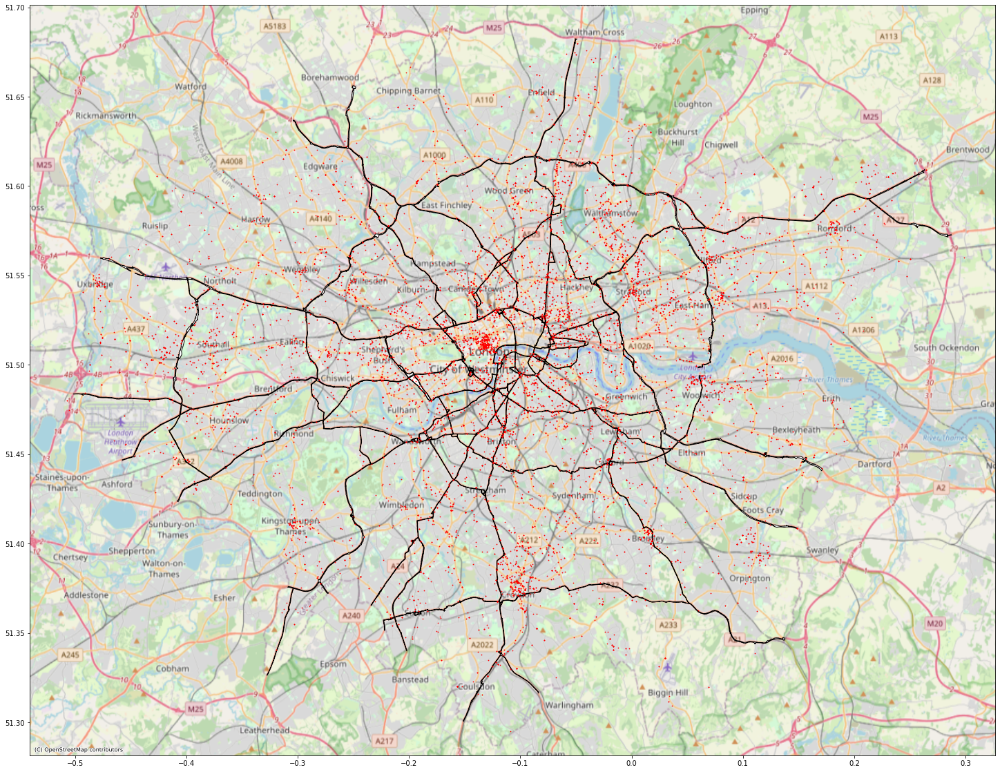

In [168]:
# geometry=[Point(xy) for xy in zip(df_4["Longitude"], df_4["Latitude"])]
# geodata=gpd.GeoDataFrame(df,crs=crs, geometry=geometry)
# geodata



base = df_1.plot(figsize=(30, 20),color='white', edgecolor='black')
# df_2.plot(ax = base)

# base = df_10.plot(figsize=(30, 20),color='white', edgecolor='black')

# cx.add_basemap(base, crs=crs, source=cx.providers.CartoDB.Voyager)

cx.add_basemap(base, crs=crs, source=cx.providers.OpenStreetMap.Mapnik)

geodata.plot(ax = base, marker='o', color='red', markersize=0.5)

<AxesSubplot:>

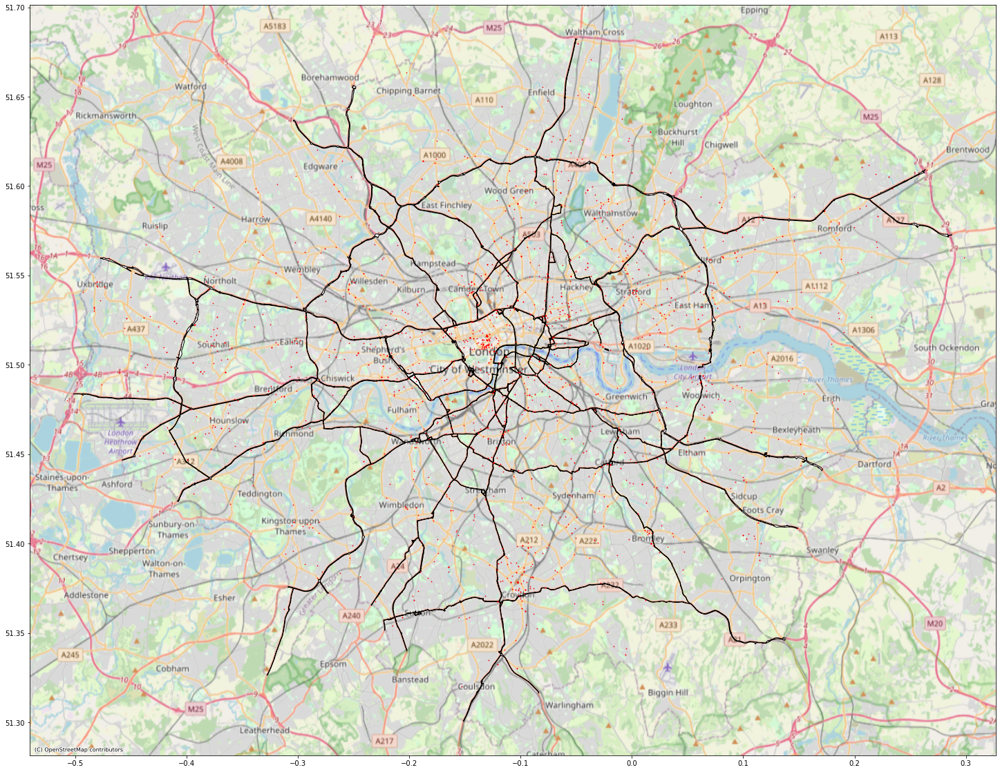

In [172]:
geodata_2 = geodata[geodata['Outcome']=='Arrest']
# geodata_2

base = df_1.plot(figsize=(30, 20),color='white', edgecolor='black')

cx.add_basemap(base, crs=crs, source=cx.providers.OpenStreetMap.Mapnik)

geodata_2.plot(ax = base, marker='o', color='red', markersize=0.5)

<AxesSubplot:>

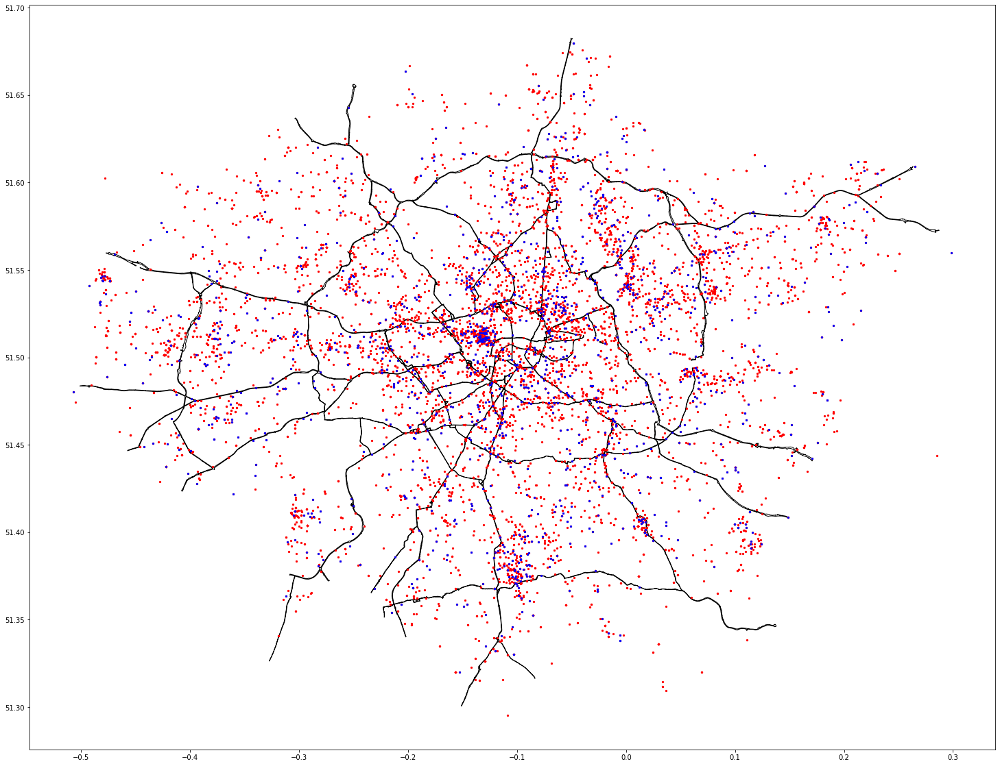

In [176]:
base = df_1.plot(figsize=(30, 20),color='white', edgecolor='black')
# df_2.plot(ax = base)

# base = df_10.plot(figsize=(30, 20),color='white', edgecolor='black')

# cx.add_basemap(base, crs=crs, source=cx.providers.CartoDB.Voyager)

# cx.add_basemap(base, crs=crs, source=cx.providers.OpenStreetMap.Mapnik)



geodata.plot(ax = base, marker='o', color='red', markersize=5)

geodata_2.plot(ax = base, marker='x', color='blue', markersize=5)

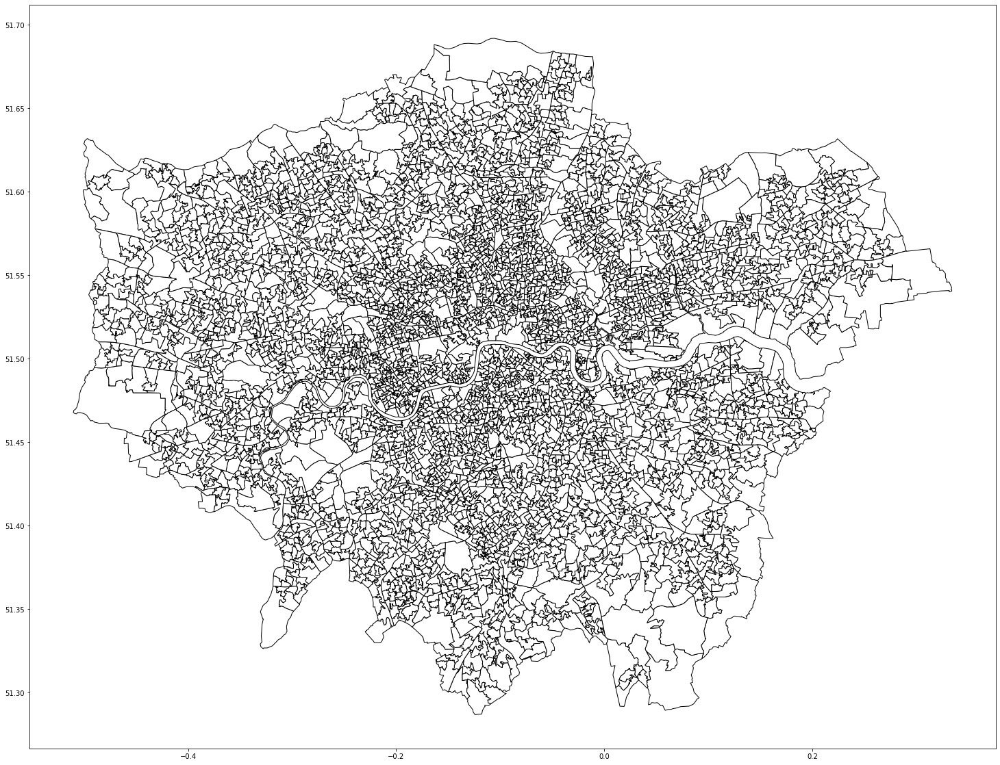

In [15]:
base = df_10.plot(figsize=(30, 20),color='white', edgecolor='black')

In [ ]:
df_6 = df_10.sjoin(df_4,how='right')
df_6 = df_6.groupby('LSOA11CD').count().reset_index()
df_6 = df_6[['LSOA11CD','Outcome']]
df_6

<AxesSubplot:>

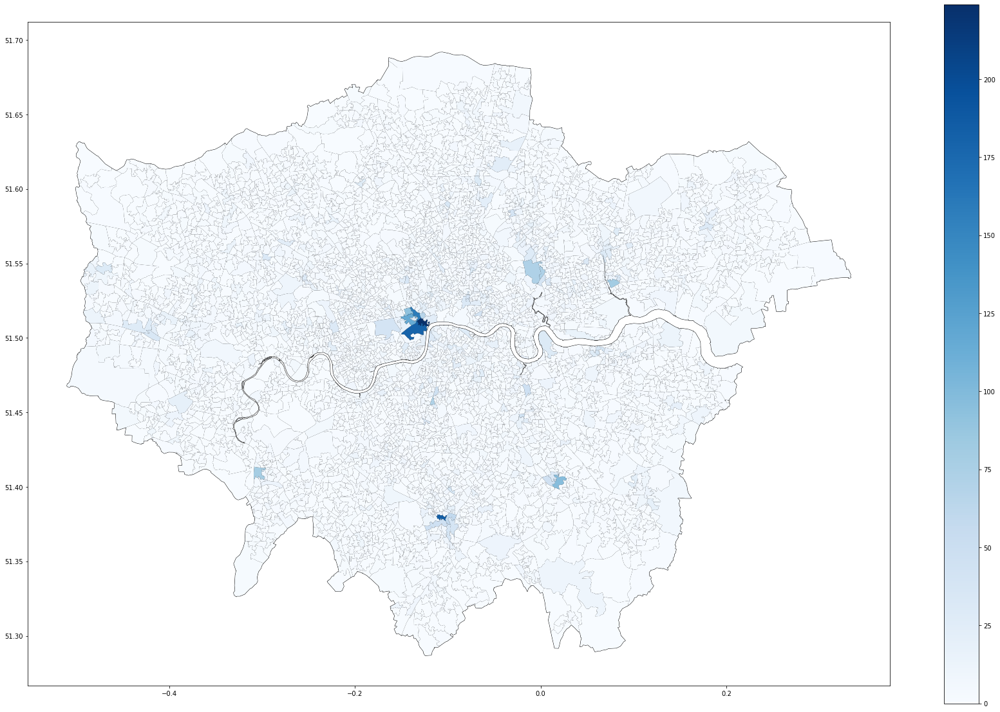

In [26]:
# df_xxx = pd.merge(df_4,df_5, how ='left', on =['Latitude','Longitude'])
# df_xxx






df_7 = pd.merge(df_10,df_6,how='left', on='LSOA11CD')
# dfxx.plot
df_7['Outcome'] = df_7['Outcome'].fillna(0)
# df['DataFrame Column'].fillna(0)
base = df_10.plot(figsize=(30, 20),color='white', edgecolor='black')
df_7.plot(ax=base, column='Outcome', legend=True,figsize=(15, 10),cmap='Blues')

In [30]:
df_7.sort_values(by='Outcome').tail(20)

,LSOA11CD,geometry,Outcome
4569,E01004689,"POLYGON ((-0.15095 51.50538, -0.15126 51.50405, -0.15226 51.50416, -0.15266 51.50382, -0.16037 51.50537, -0.15996 51.50527, -0.16162 51.50254, -0.15862 51.50280, -0.15857 51.50224, -0.16123 51.50147, -0.16294 51.50008, -0.16420 51.49940, -0.16558 51.49884, -0.16580 51.49924, -0.16778 51.49840, -0.16811 51.49893, -0.16741 51.49914, -0.16778 51.50041, -0.16737 51.50093, -0.16685 51.50111, -0.16681 51.50088, -0.16742 51.50065, -0.16739 51.50036, -0.16616 51.50048, -0.16632 51.50179, -0.16756 51.50183, -0.16878 51.50185, -0.16903 51.50222, -0.17391 51.50216, -0.17369 51.50164, -0.17569 51.50165, -0.17694 51.50157, -0.17802 51.50156, -0.17843 51.50329, -0.17761 51.50869, -0.18011 51.51095, -0.17993 51.51099, -0.17606 51.51157, -0.17458 51.51177, -0.17233 51.51201, -0.17128 51.51210, -0.16801 51.51241, -0.16696 51.51251, -0.16467 51.51274, -0.16282 51.51295, -0.16019 51.51319, -0.15840 51.51341, -0.15738 51.51150, -0.15726 51.51128, -0.15628 51.50999, -0.15430 51.50846, -0.15095 51.50538))",40.0
3250,E01003324,"POLYGON ((-0.01705 51.44975, -0.01758 51.44830, -0.01715 51.44824, -0.01724 51.44794, -0.01722 51.44705, -0.01778 51.44708, -0.01797 51.44671, -0.01895 51.44678, -0.01850 51.44731, -0.01930 51.44760, -0.01948 51.44705, -0.02003 51.44712, -0.02021 51.44691, -0.02087 51.44709, -0.02091 51.44672, -0.02101 51.44640, -0.02265 51.44657, -0.02253 51.44697, -0.02316 51.44705, -0.02308 51.44735, -0.02279 51.44850, -0.02364 51.44844, -0.02350 51.44879, -0.02130 51.44889, -0.02079 51.44889, -0.01770 51.44899, -0.01781 51.44972, -0.01705 51.44975))",44.0
662,E01000677,"POLYGON ((0.00801 51.40732, 0.00896 51.40646, 0.00933 51.40677, 0.01072 51.40609, 0.01168 51.40467, 0.01128 51.40424, 0.01203 51.40367, 0.01324 51.40376, 0.01404 51.40418, 0.01373 51.40543, 0.01433 51.40567, 0.01510 51.40516, 0.01513 51.40393, 0.01554 51.40247, 0.01497 51.40227, 0.01305 51.40162, 0.01244 51.40208, 0.01284 51.40088, 0.01283 51.40032, 0.01098 51.40069, 0.00809 51.40169, 0.00626 51.40270, 0.00614 51.40279, 0.00575 51.40309, 0.00495 51.40371, 0.00283 51.40537, 0.00173 51.40622, 0.00225 51.40668, 0.00425 51.40692, 0.00503 51.40732, 0.00614 51.40718, 0.00691 51.40757, 0.00707 51.40780, 0.00731 51.40737, 0.00795 51.40735, 0.00801 51.40732))",45.0
2980,E01003047,"POLYGON ((-0.10952 51.46546, -0.10924 51.46516, -0.10963 51.46491, -0.11011 51.46521, -0.11047 51.46479, -0.10891 51.46364, -0.11019 51.46342, -0.11051 51.46335, -0.11032 51.46309, -0.11130 51.46289, -0.11166 51.46191, -0.11233 51.46157, -0.11304 51.46169, -0.11396 51.46157, -0.11400 51.46133, -0.11332 51.46143, -0.11346 51.46082, -0.11446 51.46090, -0.11505 51.46081, -0.11537 51.46134, -0.11568 51.46128, -0.11532 51.46215, -0.11483 51.46329, -0.11479 51.46340, -0.11460 51.46383, -0.11449 51.46408, -0.11416 51.46480, -0.11355 51.46601, -0.11289 51.46728, -0.10988 51.46737, -0.11062 51.46621, -0.11017 51.46618, -0.11025 51.46561, -0.10952 51.46546))",46.0
995,E01001014,"POLYGON ((-0.10758 51.37809, -0.10721 51.37782, -0.10641 51.37786, -0.10674 51.37807, -0.10543 51.37852, -0.10427 51.37817, -0.10421 51.37783, -0.10319 51.37742, -0.10267 51.37716, -0.10214 51.37728, -0.10122 51.37547, -0.10041 51.37375, -0.10171 51.37354, -0.10291 51.37336, -0.10406 51.37359, -0.10591 51.37421, -0.10631 51.37480, -0.10643 51.37536, -0.10680 51.37537, -0.10688 51.37533, -0.10917 51.37376, -0.11149 51.37314, -0.11168 51.37313, -0.11389 51.37361, -0.11380 51.37279, -0.11590 51.37234, -0.11654 51.37231, -0.11695 51.37315, -0.11794 51.37295, -0.11748 51.37183, -0.12003 51.37143, -0.12343 51.37053, -0.12343 51.37064, -0.12336 51.37117, -0.12472 51.37289, -0.12478 51.37364, -0.12533 51.37384, -0.12176 51.37371, -0.11878 51.37453, -0.11961 51.37616, -0.11789 51.37670, -0.11637 51.37538, -0.11552 51.37511, -0.11620 51.37591, -0.11430 51.37661, -0.11345 51.37753, -0.11120 51.37690, -0.10887 51.37702, -0.10878 51.37729, -0.10868 51.37768, -0.10833 51.37760, -0.10824 51.37817, -0.10737 51.378

<AxesSubplot:ylabel='Density'>

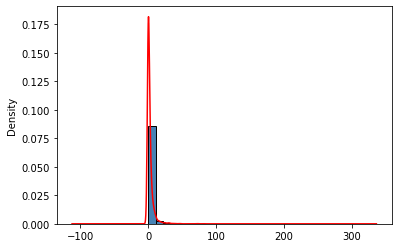

In [54]:
df_8 = df_7[['Outcome']]
# df_8
# df_8 = df_8.groupby('Outcome').count().reset_index()
# df_8
# plt.hist(df_8['Outcome'])

df_8['Outcome'].plot(kind="hist",bins=20,color="steelblue",edgecolor="black",density=True, stacked=True,label="直方图")

#加核密度图
df_8['Outcome'].plot(kind="kde",color="red",label="核密度图")

<AxesSubplot:ylabel='Density'>

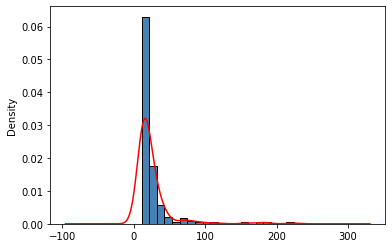

In [55]:
df_8 = df_7[df_7['Outcome']>10]
# df_8
# df_8 = df_8.groupby('Outcome').count().reset_index()
# df_8
# plt.hist(df_8['Outcome'])

df_8['Outcome'].plot(kind="hist",bins=20,color="steelblue",edgecolor="black",density=True, stacked=True,label="直方图")

#加核密度图
df_8['Outcome'].plot(kind="kde",color="red",label="核密度图")

<AxesSubplot:ylabel='Density'>

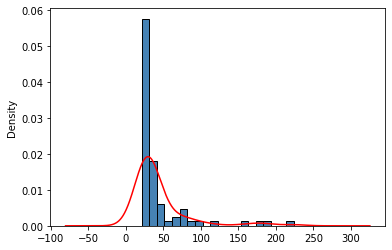

In [56]:
df_8 = df_7[df_7['Outcome']]
# df_8
# df_8 = df_8.groupby('Outcome').count().reset_index()
# df_8
# plt.hist(df_8['Outcome'])

df_8['Outcome'].plot(kind="hist",bins=20,color="steelblue",edgecolor="black",density=True, stacked=True,label="直方图")

#加核密度图
df_8['Outcome'].plot(kind="kde",color="red",label="核密度图")

In [65]:
# df_7['sss'] = df_7['Outcome'].apply(lambda x : x=0 if x)

In [134]:
# df_7['Outcome1'] = df_7['Outcome'].apply(lambda x: 0 if x==0 else( 1 if x >= 1 and x<10 else (2 if x >=10 and x<20 else (3 if x>=20 and x<40 else 4))))

def cat (x):
    if x == 0:
        return 0
    elif x<=5 and x>0:
        return 1
    elif x>5 and x<=10:
        return 2
    elif x>10 and x<=30:
        return 3
    else:
        return 4


df_7['Outcome1'] = df_7['Outcome'].apply(cat)


([<matplotlib.patches.Wedge at 0x7fa702c15450>,
 [Text(0.21201378049258035, 1.0793748917226322, '0'),
  Text(-0.6051342563520148, -0.9185926909078334, '0 to 5'),
  Text(0.9442413127985854, -0.5642768320641953, '5 to 10'),
  Text(1.0827394131668069, -0.19410142496952162, '10 to 30'),
  Text(1.0995904188163987, -0.030015176947289002, '30+')],
 [Text(0.11564388026868018, 0.5887499409396175, '43.83%'),
  Text(-0.3300732307374626, -0.501050558677, '43.81%'),
  Text(0.5150407160719556, -0.30778736294410647, '7.59%'),
  Text(0.5905851344546219, -0.10587350452882996, '3.91%'),
  Text(0.5997765920816719, -0.01637191469852127, '0.87%')])

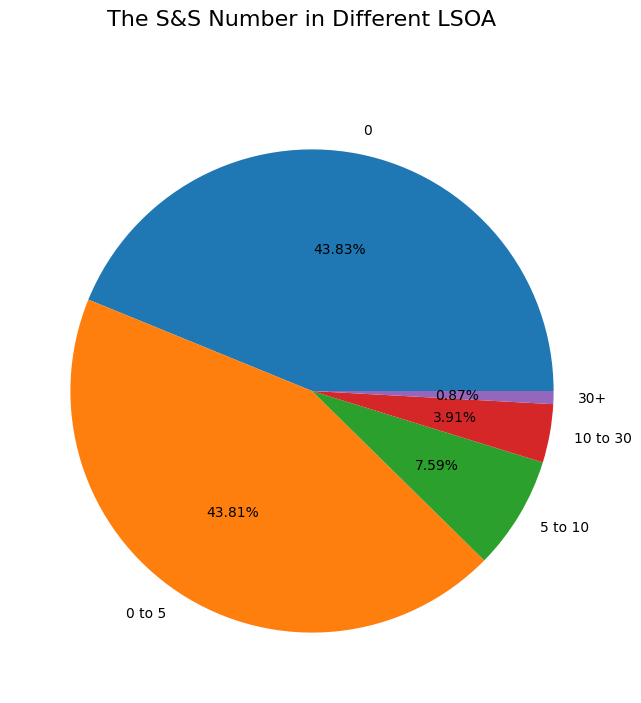

In [159]:
df_pie = df_7.groupby('Outcome1').count()
fig = plt.figure(dpi=100,figsize=(8,8))

fig.suptitle('The S&S Number in Different LSOA', fontsize=16)

mylabels = ["0", '0 to 5', "5 to 10", "10 to 30",'30+']

plt.pie(df_pie['LSOA11CD'],labels = mylabels,autopct='%1.2f%%')


In [90]:
# df_7[df_7['Outcome1']==4]
# df_7

In [135]:
df_8 = df_7[['Outcome1']]
df_8.groupby('')
# df_8
# df_8 = df_8.groupby('Outcome').count().reset_index()
# df_8
# plt.hist(df_8['Outcome'])

# df_8['Outcome'].plot(kind="hist",bins=20,color="steelblue",edgecolor="black",density=True,label="直方图")

#加核密度图
# df_8['Outcome'].plot(kind="kde",color="red",label="核密度图")


,Outcome1
0,0
1,0
2,0
3,1
4,1
...,...
4830,0
4831,1
4832,0
4833,1


In [115]:


# df_7 = pd.merge(df_10,df_6,how='left', on='LSOA11CD')
# dfxx.plot
# df_7['Outcome'] = df_7[df_7['Outcome']>10].fillna(0)
# df['DataFrame Column'].fillna(0)
# base = df_10.plot(figsize=(30, 20),color='white', edgecolor='black')
# df_7.plot(ax=base, column='Outcome',figsize=(15, 10),cmap='Blues')
# df_7['Outcome'] = df_7['Outcome'].fillna(0)
# df_7['Outcome'] = df_7[df_7['Outcome']==0]
# df_7
# df_7.plot(ax=base,figsize=(15, 10),color='cyan')

<AxesSubplot:>

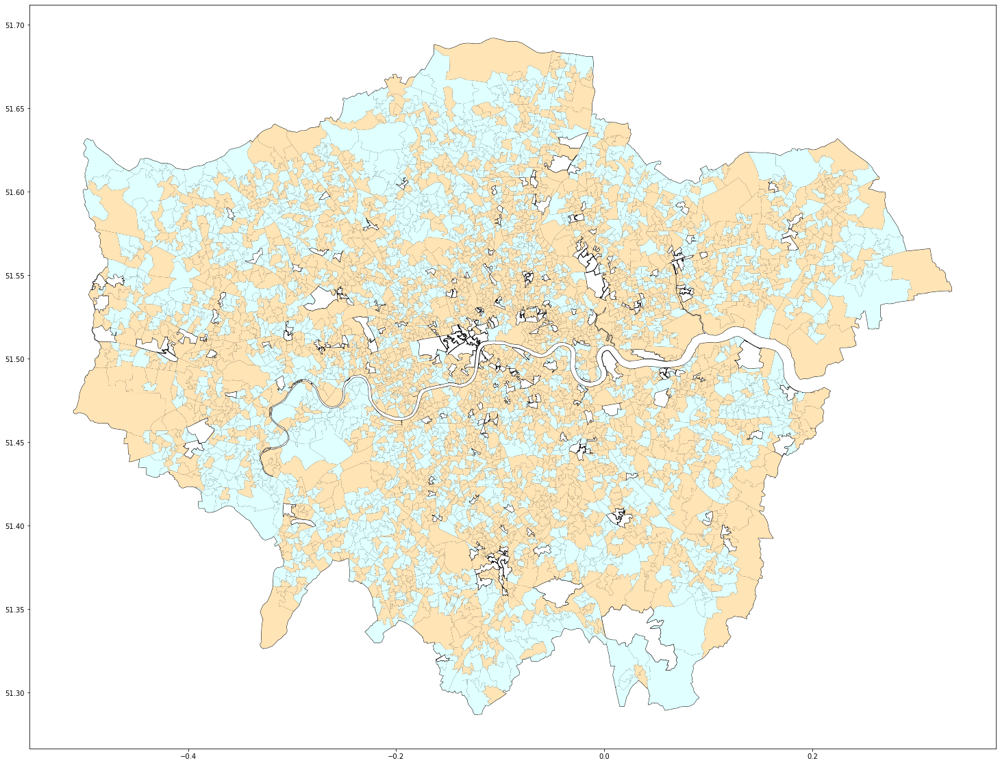

In [131]:
df_7 = pd.merge(df_10,df_6,how='left', on='LSOA11CD')
df_7['Outcome'] = df_7['Outcome'].fillna(0)
df_8 = df_7[df_7['Outcome']==0]
df_18 = df_7[(df_7['Outcome']>0) & (df_7['Outcome']<=10)]
base = df_10.plot(figsize=(30, 20),color='white', edgecolor='black')
df_8.plot(ax=base,color='lightcyan')
df_18.plot(ax=base,color='moccasin')

In [125]:

df_18

,LSOA11CD,geometry,Outcome,Outcome1
3,E01000005,"POLYGON ((-0.07323 51.51000, -0.07553 51.50974, -0.07617 51.51048, -0.07644 51.51343, -0.08004 51.51567, -0.07915 51.51632, -0.07822 51.51749, -0.07737 51.51740, -0.07592 51.51589, -0.07582 51.51583, -0.07397 51.51445, -0.07345 51.51355, -0.07319 51.51257, -0.07276 51.51080, -0.07273 51.51019, -0.07323 51.51000))",1.0,1
4,E01000006,"POLYGON ((0.09115 51.53909, 0.09326 51.53787, 0.09360 51.53767, 0.09258 51.53759, 0.09207 51.53755, 0.08962 51.53739, 0.08652 51.53758, 0.08497 51.53790, 0.08512 51.53815, 0.08531 51.53836, 0.08492 51.53852, 0.08577 51.53918, 0.08619 51.53901, 0.08678 51.53944, 0.08507 51.54036, 0.08650 51.54125, 0.08612 51.54154, 0.08646 51.54178, 0.08853 51.54058, 0.08962 51.53996, 0.09115 51.53909))",3.0,1
6,E01000008,"MULTIPOLYGON (((0.07135 51.54169, 0.07229 51.54166, 0.07320 51.54221, 0.07350 51.54190, 0.07263 51.54143, 0.07272 51.54078, 0.07295 51.54018, 0.07217 51.54003, 0.07191 51.53896, 0.07202 51.53840, 0.07254 51.53772, 0.07134 51.53725, 0.07043 51.53912, 0.06950 51.53887, 0.06978 51.54034, 0.06991 51.54091, 0.06924 51.54165, 0.06990 51.54215, 0.07058 51.54237, 0.07169 51.54180, 0.07135 51.54169)), ((0.06858 51.53622, 0.06803 51.53615, 0.06908 51.53734, 0.06828 51.53815, 0.06693 51.53986, 0.06669 51.54115, 0.06828 51.54429, 0.06833 51.54441, 0.06937 51.54413, 0.06859 51.54213, 0.06910 51.54138, 0.06850 51.54092, 0.06942 51.54030, 0.06913 51.53881, 0.07045 51.53851, 0.07103 51.53715, 0.06858 51.53622)))",7.0,2
11,E01000013,"POLYGON ((0.15142 51.54398, 0.15160 51.54303, 0.15029 51.54291, 0.14984 51.54172, 0.14790 51.54160, 0.14721 51.54155, 0.14366 51.54132, 0.14304 51.54128, 0.14057 51.54113, 0.14056 51.54176, 0.14257 51.54230, 0.14257 51.54280, 0.14385 51.54325, 0.14416 51.54385, 0.14317 51.54429, 0.14297 51.54477, 0.14377 51.54491, 0.14451 51.54473, 0.14564 51.54569, 0.14619 51.54536, 0.14578 51.54418, 0.14622 51.54395, 0.14735 51.54363, 0.14729 51.54427, 0.14792 51.54424, 0.14956 51.54401, 0.15014 51.54418, 0.15012 51.54459, 0.15039 51.54460, 0.15118 51.54479, 0.15077 51.54552, 0.15134 51.54632, 0.15208 51.54634, 0.15276 51.54588, 0.15208 51.54581, 0.15233 51.54465, 0.15182 51.54450, 0.15192 51.54406, 0.15142 51.54398))",5.0,1
12,E01000014,"POLYGON ((0.14459 51.54637, 0.14601 51.54616, 0.14644 51.54646, 0.14705 51.54588, 0.14783 51.54592, 0.14793 51.54591, 0.14850 51.54558, 0.14808 51.54512, 0.14861 51.54477, 0.14792 51.54424, 0.14729 51.54427, 0.14735 51.54363, 0.14622 51.54395, 0.14578 51.54418, 0.14619 51.54536, 0.14564 51.54569, 0.14451 51.54473, 0.14377 51.54491, 0.14297 51.54477, 0.14317 51.54429, 0.14416 51.54385, 0.14385 51.54325, 0.14257 51.54280, 0.14257 51.54230, 0.14056 51.54176, 0.14057 51.54113, 0.14023 51.54111, 0.13731 51.54092, 0.13685 51.54089, 0.13422 51.54072, 0.13418 51.54072, 0.13391 51.54162, 0.13419 51.54188, 0.13189 51.54377, 0.13675 51.54423, 0.13858 51.54567, 0.14155 51.54454, 0.14206 51.54508, 0.14230 51.54533, 0.14190 51.54549, 0.14295 51.54662, 0.14459 51.54637))",1.0,1
...,...,...,...,...
4826,E01033738,"POLYGON ((0.02312 51.49002, 0.02317 51.48886, 0.02229 51.48664, 0.02143 51.48572, 0.02321 51.48580, 0.02329 51.48469, 0.02146 51.48453, 0.02027 51.48442, 0.02015 51.48441, 0.01978 51.48438, 0.01585 51.48400, 0.01592 51.48443, 0.01571 51.48588, 0.01650 51.48636, 0.01668 51.48602, 0.01718 51.48629, 0.01812 51.48606, 0.01745 51.48669, 0.01773 51.48687, 0.01720 51.48756, 0.01436 51.48842, 0.01546 51.48933, 0.01740 51.48912, 0.01757 51.48911, 0.01814 51.49044, 0.01949 51.49014, 0.02461 51.49001, 0.02312 51.49002))",1.0,1
4827,E01033739,"POLYGON ((0.09020 51.50431, 0.09015 51.50318, 0.09014 51.50303, 0.08849 51.50294, 0.08769 51.50246, 0.08787 51.50188, 0.08804 51.50127, 0.08855 51.50113, 0.08808 51.50069, 0.08702 51.50107, 0.08671 51.50090, 0.08570 51.50125, 0.08465 51.50044, 0.08414 51.50074, 0.08487 51.50154, 0.08514 51.50184, 0.08644 51.50333, 0.08662 51.50351, 0.08678 51.50346, 0.08687 51.50342, 0.08759 51.50397, 0.08793 51